In [1]:
from astropy.io import fits
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
import seaborn as sns
from scipy import stats
import matplotlib.mlab as mlab
import os
from scipy.stats import norm
from scipy.optimize import curve_fit

from photutils import DAOStarFinder
from astropy.stats import mad_std
from photutils import aperture_photometry, CircularAperture, CircularAnnulus
%matplotlib inline

from astropy.stats import sigma_clip

import matplotlib.pyplot as plt
from astropy.modeling import models, fitting

sns.set()


plt.rcParams['figure.figsize'] = [15, 10]

In [2]:
def array(name,x,y,a,b):
    filelist = glob(name)
    
    #set empty arrays to be filled
    mean_array = []
    std_array = []
    temp_array = []
    exp_array = []
    
    #goes through each image and gets the information
    for file in filelist:
        image = fits.open(file)
        
        mean = (image[0].data[x:y,a:b]).mean()
        mean_array.append(mean)
        
        std = (image[0].data[x:y,a:b]).std()
        std_array.append(std)
        
        temperature = image[0].header['CCD-TEMP']
        temp_array.append(temperature)
        
        time = image [0].header['EXPTIME']
        exp_array.append (time)
        
        
    return mean_array, std_array, temp_array, exp_array

In [3]:
def master(name):
    lis = glob(name)
    dat = []
    for file in lis:
        image = fits.open(file)
        dat.append(image[0].data)

    return np.average(dat, axis=0)

def sigmaclip(name): 
    
    i = 0 
    data = []
    lis = glob(name)
    while i < len(lis):
        
        pdat = fits.open(lis[i])[0].data

        
        
        data.append(pdat)
        
        i += 1
    
    master = np.mean(data, axis = 0)
    

    return master
    

In [4]:
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/bias')
m = master('B120308*')
masterbias = np.delete(m,np.s_[0:50],axis = 1)
hdu = fits.PrimaryHDU(masterbias)
hdul = fits.HDUList([hdu])
hdul.writeto('masterbias.fits', overwrite = True)

In [5]:
#new bias subflats
def biassubflat(name):
    
    i = 0 
    
    lis = glob(name)
    while i < len(lis):
        
        f = fits.open(lis[i])[0].data
        flat = np.delete(f,np.s_[0:50],axis = 1)
        bias = masterbias
        sub = flat -bias
        
        #writing the new files
        
        name = 'bflat_0{}'.format(i+1)
        
        hdu = fits.PrimaryHDU(sub)
        hdul = fits.HDUList([hdu])
        hdul.writeto(name+'.fits', overwrite = True)
        i += 1
    
    
    return 

In [6]:
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/flats/clear')
biassubflat('F120308*')


In [7]:
masterflatclear = master('bflat_*')
hdu2 = fits.PrimaryHDU(masterflatclear)
hdu3 = fits.HDUList([hdu2])
hdu3.writeto('masterflatc.fits', overwrite = True)

In [8]:
mfc = fits.open('masterflatc.fits')
master= (mfc[0].data[400:600,600:800]).astype(float)
av = np.mean(master)
nmasterflatc = ((mfc[0].data[0:2048,0:2098]).astype(float))/av
print(np.mean(nmasterflatc))
hdun = fits.PrimaryHDU(nmasterflatc)
hdun1 = fits.HDUList([hdun])
hdun1.writeto('nmasterflatclear.fits', overwrite = True)


1.0041325330672872


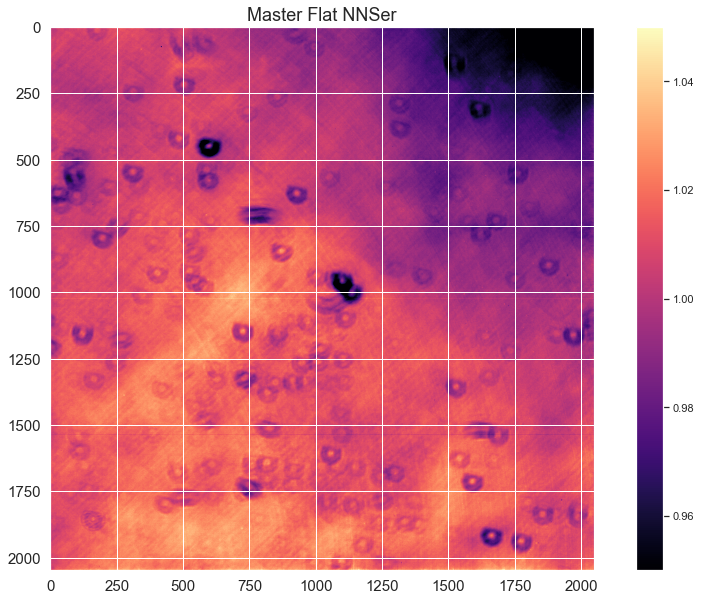

1.0041325330672872 422.85589651834425


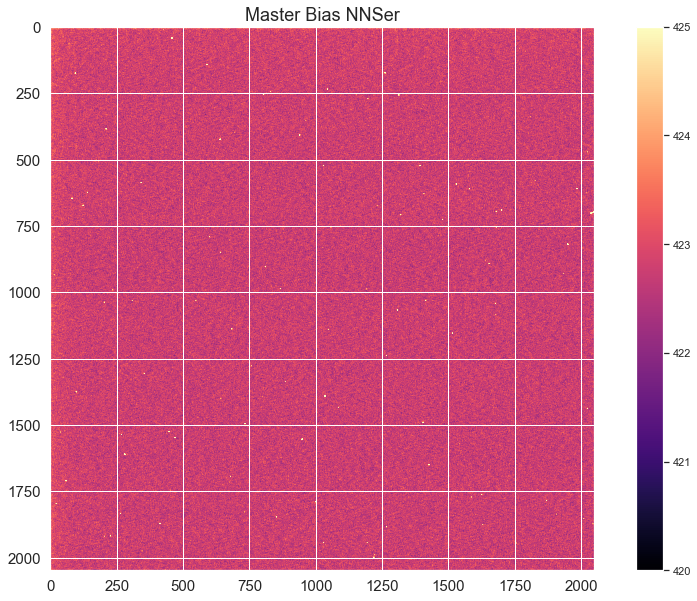

In [9]:
#showing the master flats

plt.imshow(nmasterflatc,vmin=0.95,vmax=1.05, cmap = 'magma')

plt.title('Master Flat NNSer', fontsize = 18)
plt.tick_params(labelsize=15)
plt.colorbar()


os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('masterflatNNSer.png')
plt.show() 

print(np.mean(nmasterflatc),np.mean(masterbias))

plt.imshow(masterbias,vmin = 420,vmax=425, cmap = 'magma')
plt.title('Master Bias NNSer', fontsize = 18)
plt.tick_params(labelsize=15)

plt.colorbar()



plt.savefig('masterbiasNNSer.png')
plt.show() 

In [10]:
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')


f = sigmaclip('O120308*')
flat = np.delete(f,np.s_[0:50],axis = 1)



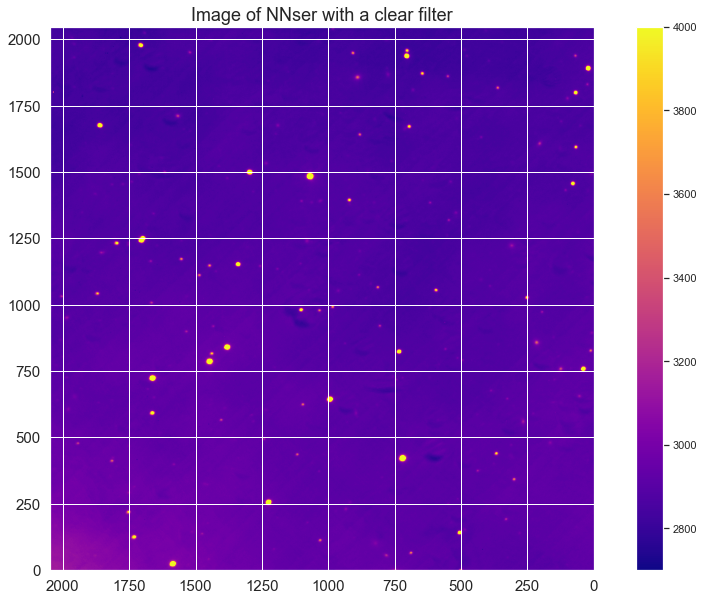

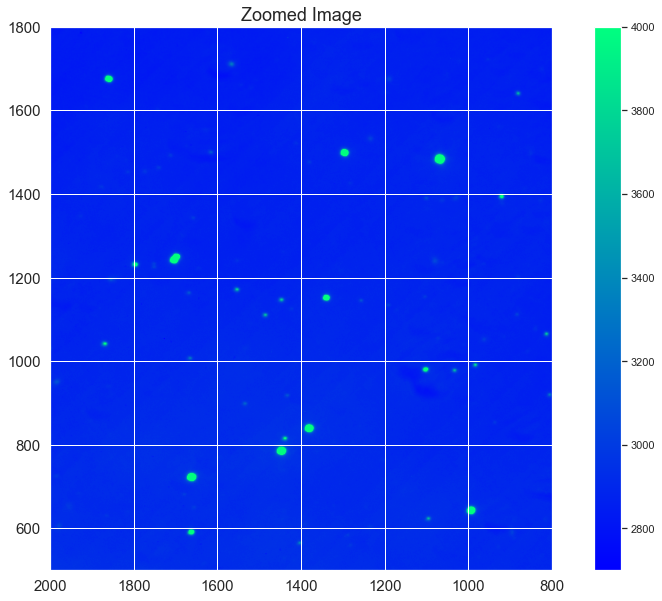

(2048, 2048)


In [11]:
#creating images of NNSer
imagec = (flat - masterbias)/nmasterflatc

plt.imshow(imagec,vmax = 4000, vmin = 2700, cmap = 'plasma')
plt.title('Image of NNser with a clear filter', fontsize = 18)
plt.tick_params(labelsize=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.colorbar()

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('masterimageNNSer.png')
plt.show() 

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')

hdunc = fits.PrimaryHDU(imagec)
hduncc = fits.HDUList([hdunc])
hduncc.writeto('comboimfinal.fits', overwrite = True)

plt.imshow(imagec,vmax = 4000, vmin = 2700, cmap = 'winter')
plt.title('Zoomed Image', fontsize = 18)
plt.tick_params(labelsize=15)
plt.xlim(2000,800)
plt.ylim(500,1800)

plt.colorbar()
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('masterimageNNSerzoom.png')
plt.show() 



print(np.shape(imagec))


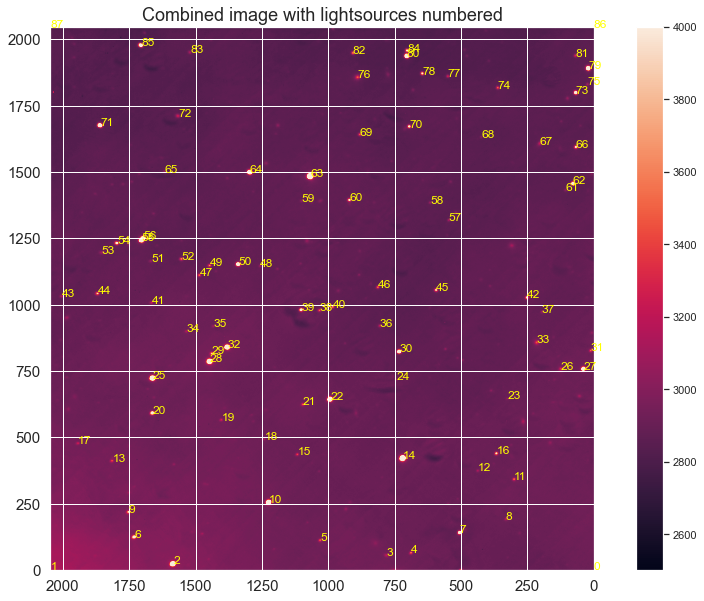

In [12]:
#now we number each star by photometry 

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')
imageNN = fits.open('comboimfinal.fits')
imagedat = imageNN[0].data

master_std = mad_std(imagedat)
masterdaofind = DAOStarFinder(fwhm=6., threshold= 5*master_std)
mastersources = masterdaofind(imagedat)

for i in range(0, len(mastersources)): 
        plt.annotate(i, (mastersources['xcentroid'][i], mastersources['ycentroid'][i]), color = 'yellow')

plt.imshow(imagedat, vmin=2500, vmax=4000)
plt.title('Combined image with lightsources numbered', fontsize = 18)
plt.tick_params(labelsize=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.colorbar()


os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('numberedimageNNSerzoom.png')
plt.show() 
        

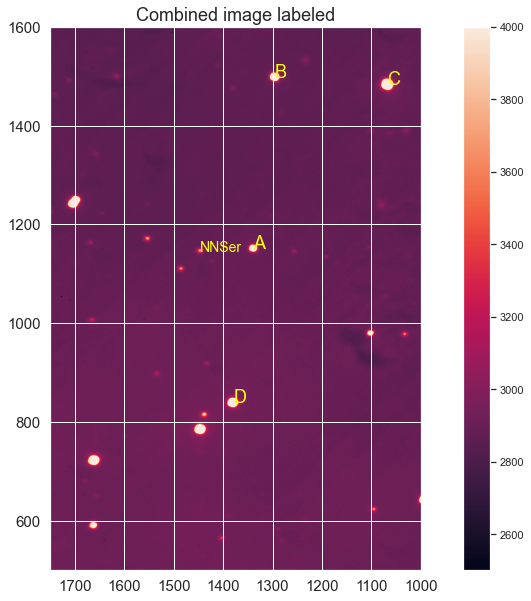

In [108]:
#identifying all the stars given in the manual including NNSer
plt.annotate('D', (mastersources['xcentroid'][32], mastersources['ycentroid'][32]), color = 'yellow', fontsize = 18)
plt.annotate('NNSer', (mastersources['xcentroid'][49], mastersources['ycentroid'][49]), color = 'yellow',fontsize = 14)
plt.annotate('A', (mastersources['xcentroid'][50], mastersources['ycentroid'][50]), color = 'yellow',fontsize = 18)
plt.annotate('B', (mastersources['xcentroid'][64], mastersources['ycentroid'][64]), color = 'yellow',fontsize = 18)
plt.annotate('C', (mastersources['xcentroid'][63], mastersources['ycentroid'][63]), color = 'yellow',fontsize = 18)

plt.imshow(imagedat, vmin=2500, vmax=4000)
plt.title('Combined image labeled', fontsize = 18)
plt.tick_params(labelsize=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.xlim(1750,1000)
plt.ylim(500,1600)
plt.colorbar()


os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('labeledNNSer.png')
plt.show()

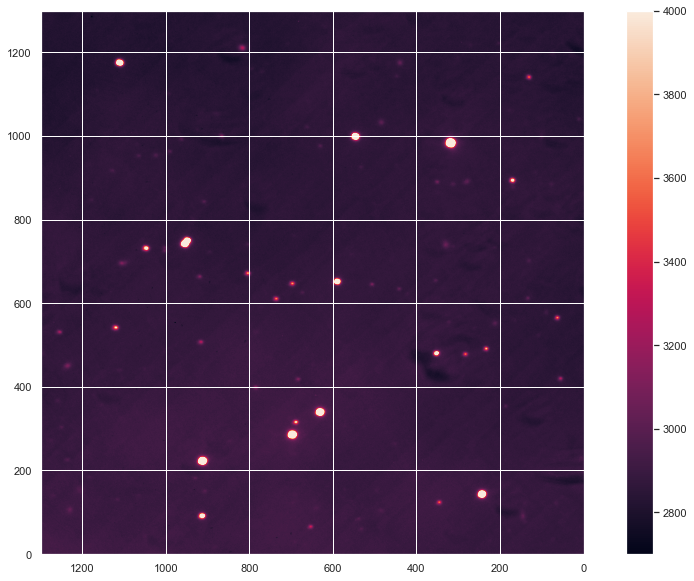

PermissionError: [WinError 32] The process cannot access the file because it is being used by another process: 'NNser.fits'

In [103]:
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')
im = fits.open('comboimagefinal.fits')
dat = im[0].data[500:1800,800:2100]

#the origional image is inverted to match the image in the lab manual
plt.imshow(dat, vmin=2700, vmax=4000)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.colorbar()


    
plt.show()

hdunNNser = fits.PrimaryHDU(dat)
hdunNNser1 = fits.HDUList([hdunNNser])
hdunNNser1.writeto('NNser.fits', overwrite = True)

In [14]:
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')

lis = glob('O120308*')
lis = np.sort(lis)
i = 0

#reducing each image and saving them
for i in range(0, len(lis)):
    openim = fits.open(lis[i])
    im = np.delete(openim[0].data, np.s_[0:50],axis = 1)
    image = (im -masterbias)/nmasterflatc
    
    time = openim[0].header['UT']
    
    name = 'red_{}'.format(i+1)
   
    hdunNNser = fits.PrimaryHDU(image)
    header = hdunNNser.header
    header['TIME'] = time
    hdunNNser1 = fits.HDUList([hdunNNser])
    hdunNNser1.writeto(name+'.fits', overwrite = True)
    
    
    
    

In [15]:
for image in glob('red_*'):
#     print(image)
    image = fits.getdata(image)
    print(image.mean())

2111.13104178049
3154.5190449960046
3142.9160365936714
3088.005801177484
3140.7678144931097
3583.9285107897626
3167.4343213160946
2916.3799896637856
2874.6209564806154
2889.1160776677416
2084.7793664512365
2070.549688736376
2058.0670299915964
3187.2054476633243
3219.8270591501064
3169.6083317780863
3104.260783216833
3195.03677475261


02:53:45.905
2111.13104178049


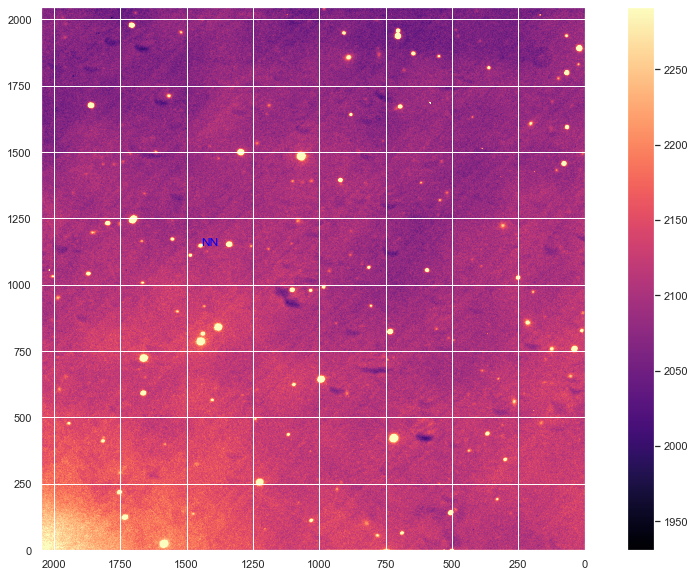

03:10:30.831
3154.5190449960046


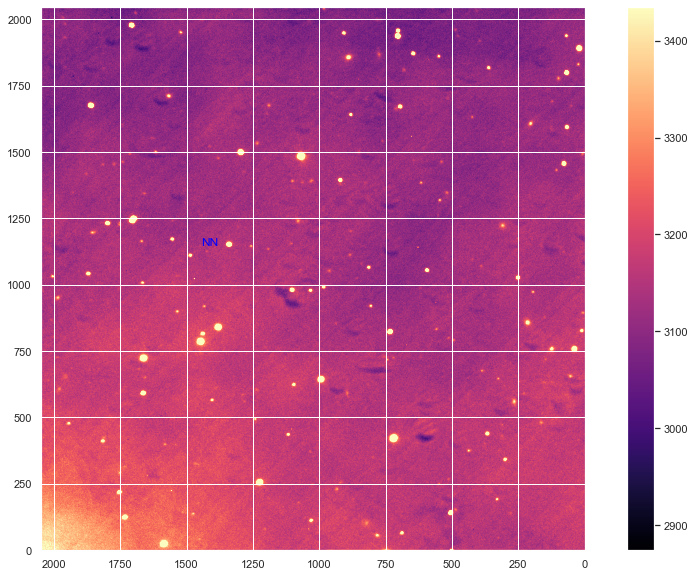

03:12:26.645
3142.9160365936714


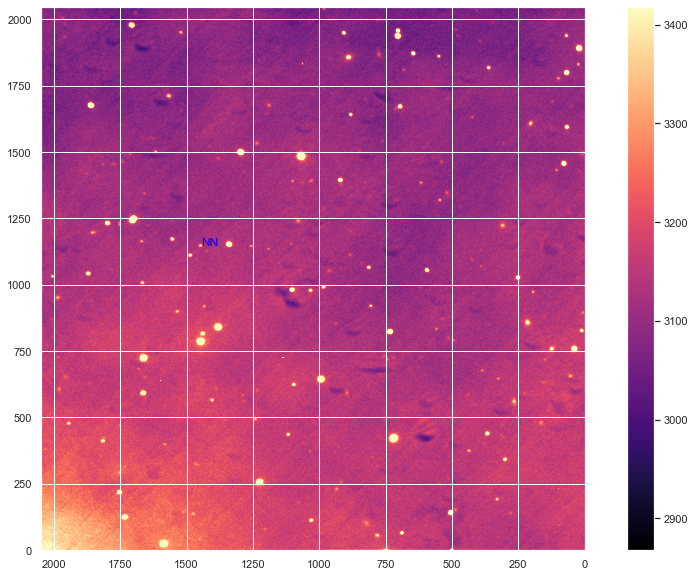

03:14:22.685
3088.005801177484


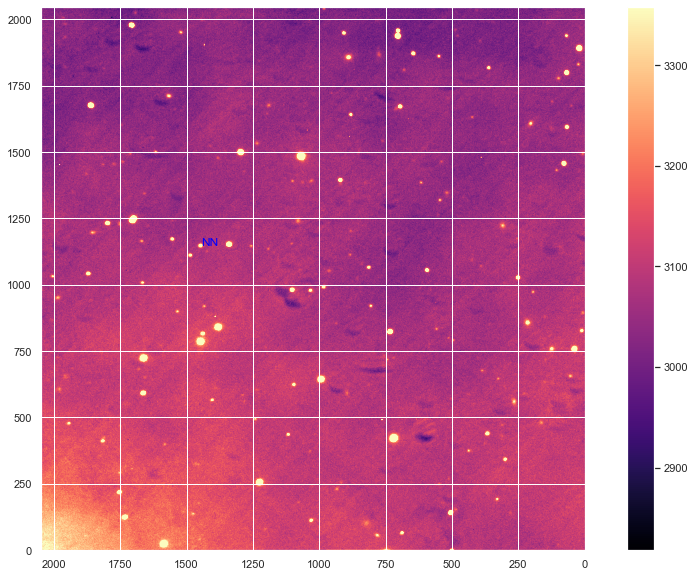

03:16:18.615
3140.7678144931097


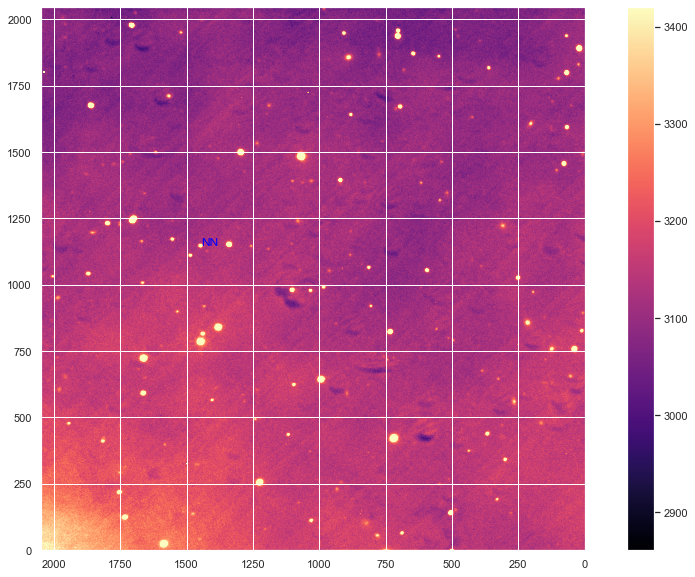

03:18:14.335
3583.9285107897626


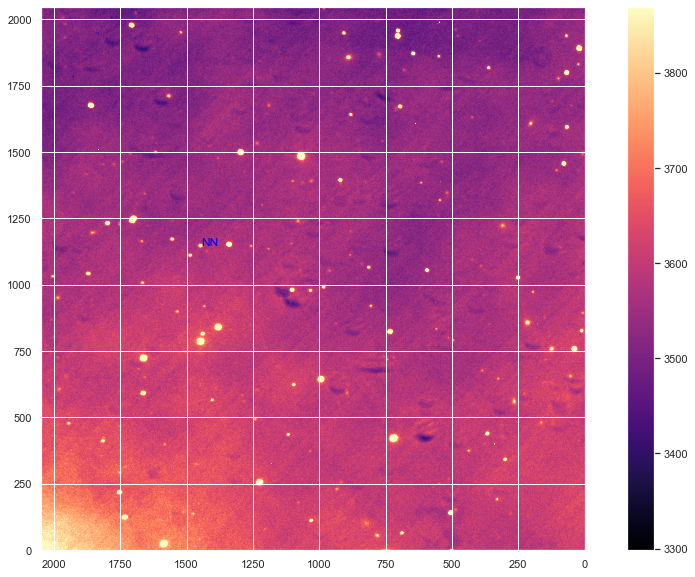

03:20:10.024
3167.4343213160946


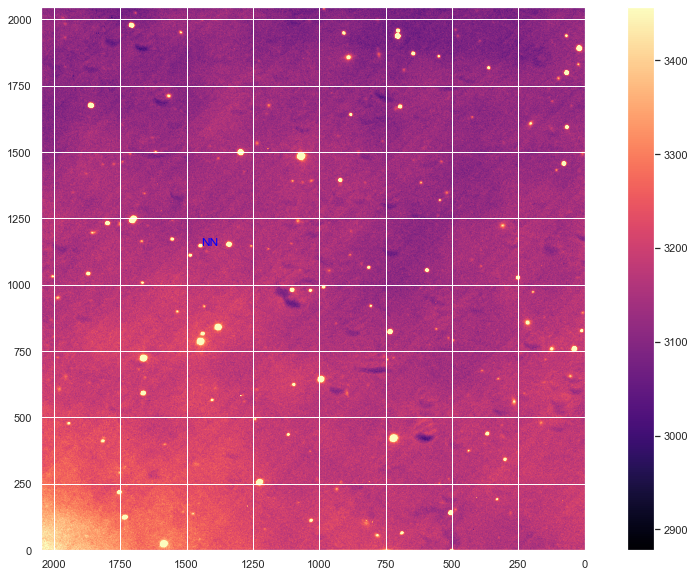

03:22:05.837
2916.3799896637856


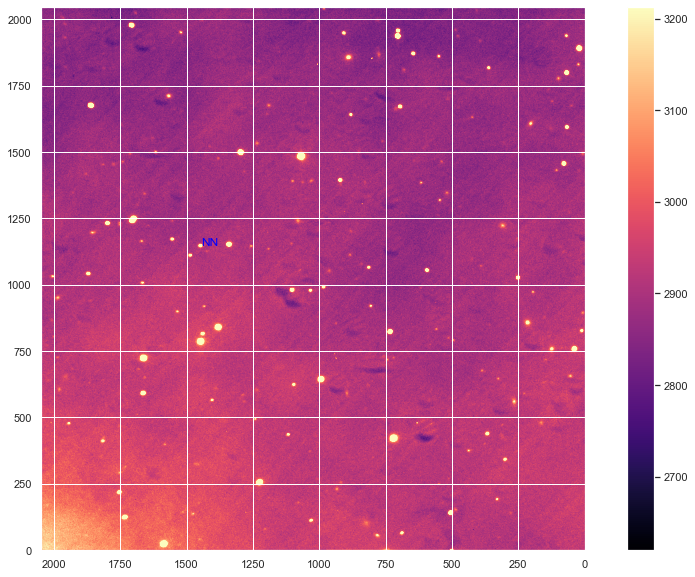

03:24:02.236
2874.6209564806154


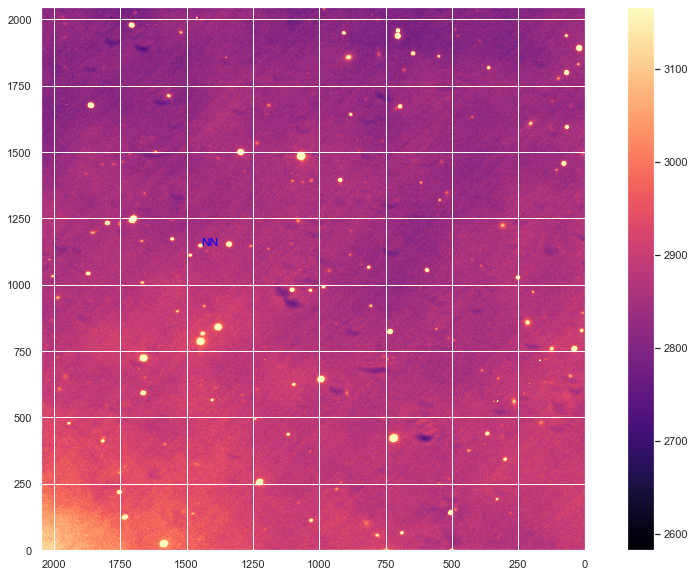

03:25:57.417
2889.1160776677416


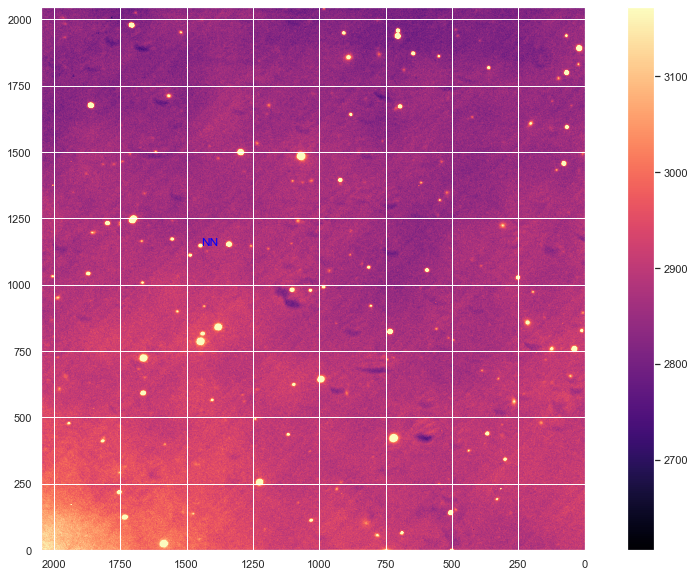

02:55:10.873
2084.7793664512365


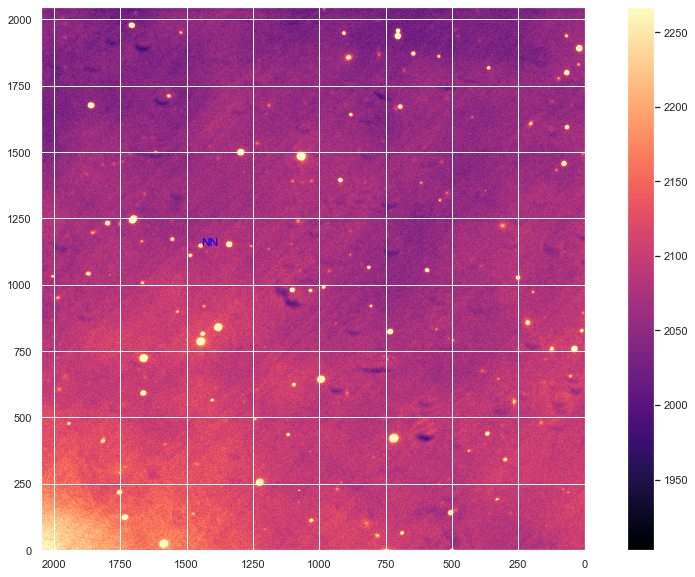

02:56:36.574
2070.549688736376


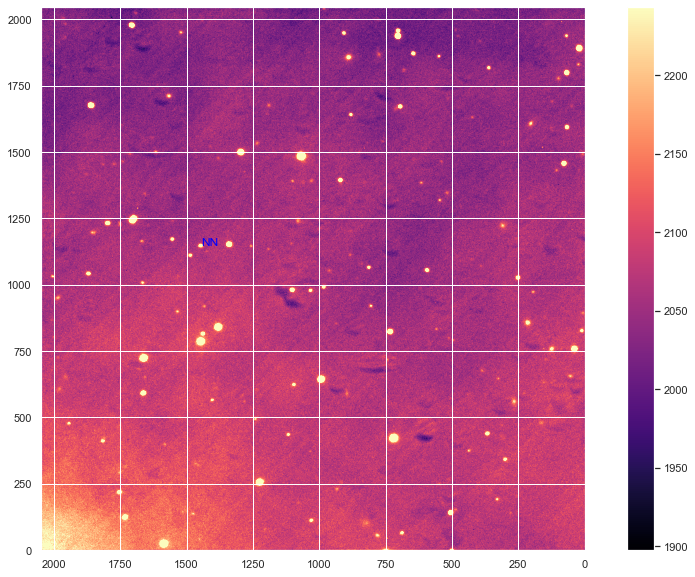

02:58:02.653
2058.0670299915964


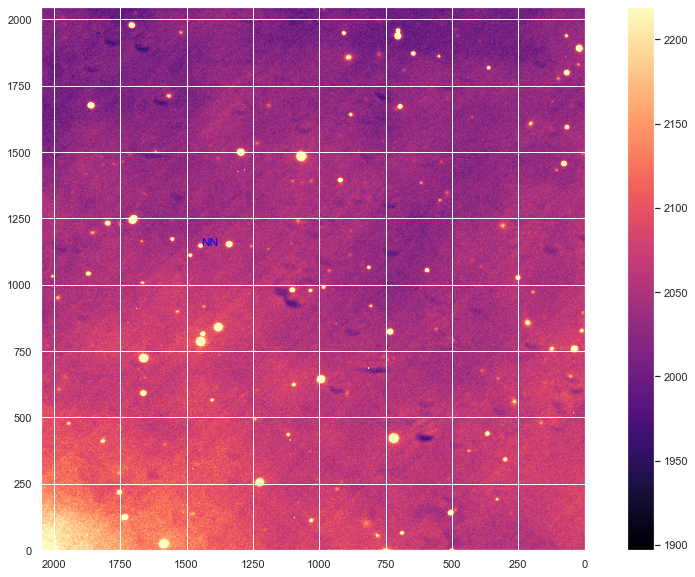

03:00:52.123
3187.2054476633243


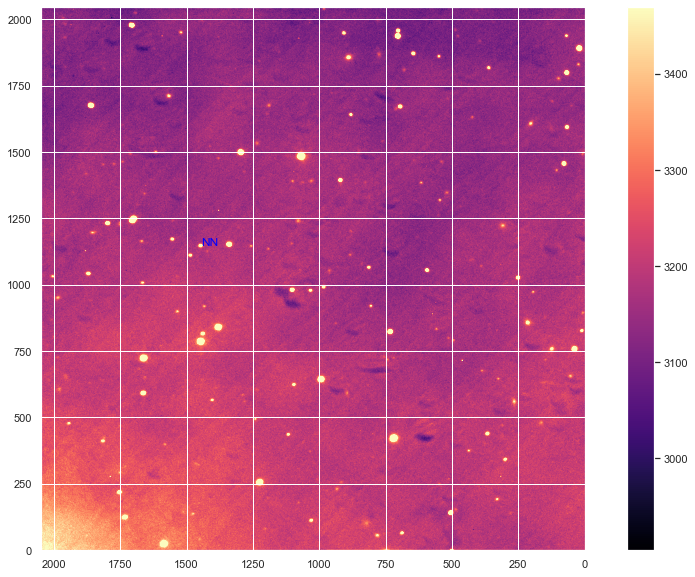

03:02:48.093
3219.8270591501064


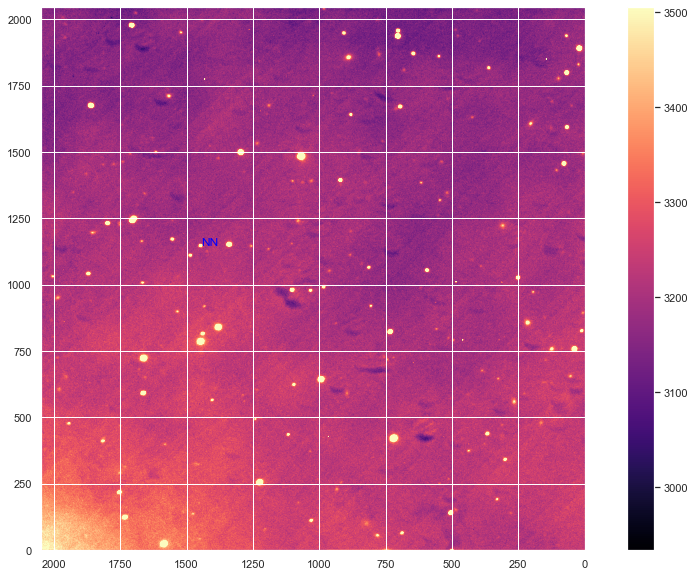

03:04:43.753
3169.6083317780863


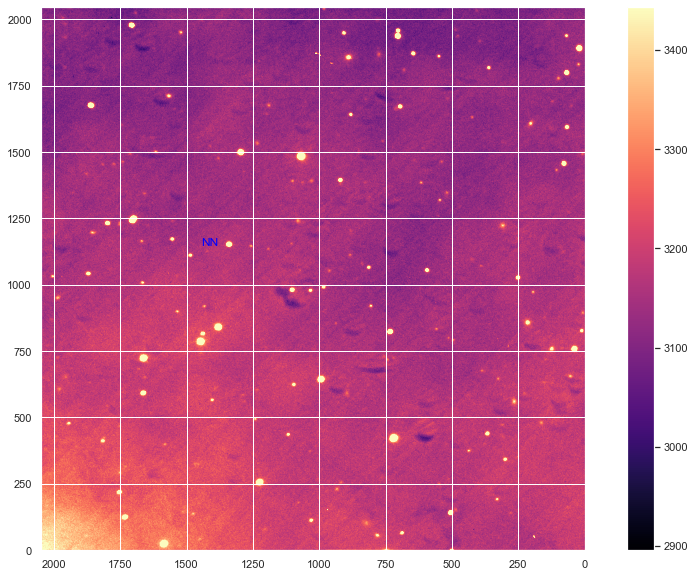

03:06:39.454
3104.260783216833


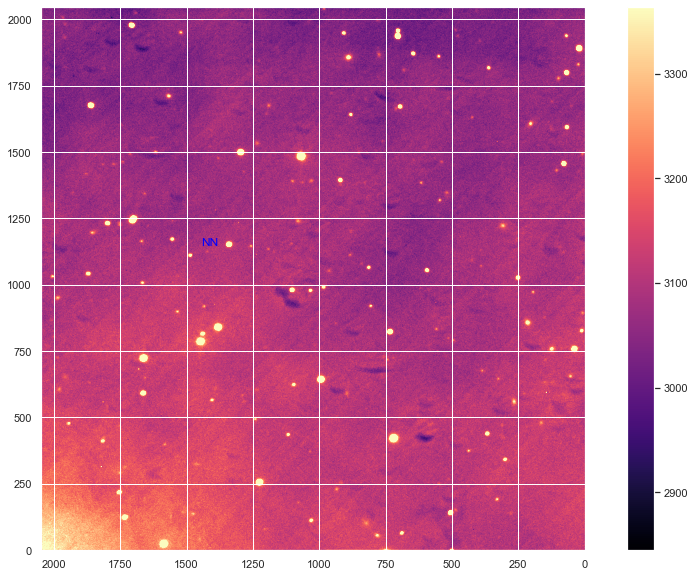

03:08:35.049
3195.03677475261


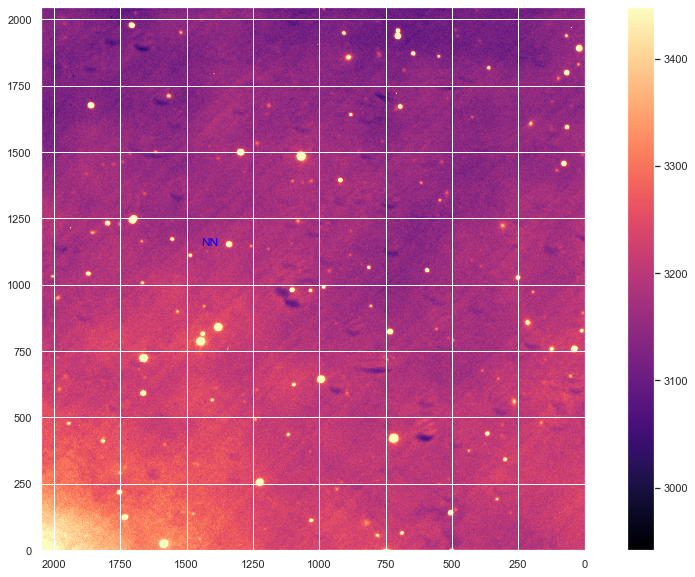

In [17]:
#looking at NNser in each image
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')

for image in glob('red_*'):
#     print(image)
    openim = fits.open(image)
    print(openim[0].header['TIME'])
    
    image = fits.getdata(image)
    print(image.mean())
   
    bkg_sigma = mad_std(image)
    daofind = DAOStarFinder(fwhm=6., threshold= 5*bkg_sigma)
    sources = daofind(image)
    # Get the positions of sources in the field from the table above.
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))

    # Set up aperture and annulus
    aperture = CircularAperture(positions, r=5.)
    annulus_aperture = CircularAnnulus(positions, r_in=10., r_out=15.)

    # Make a list of apertures
    apers = [aperture, annulus_aperture]

    # And run aperture photometry
    phot_table = aperture_photometry(image, apers)


    # We calculate the mean counts in each pixel in the background annulus, and then multiply by the area
    # in the aperture to get the total background counts within each aperture

    bkg_mean = (phot_table['aperture_sum_1'])/(annulus_aperture.area)
    bkg_sum = bkg_mean * aperture.area

    # Now we get the final table of background subtracted counts within each aperture
    final_sum = phot_table['aperture_sum_0'] - bkg_sum


    plt.imshow(image, vmin=np.mean(image)-np.std(image), vmax=np.mean(image)+np.std(image), cmap = 'magma')
#     print(np.mean(image))
    plt.annotate('NN', (mastersources['xcentroid'][49], mastersources['ycentroid'][49]), color = 'blue')
    
    plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
    
    plt.colorbar()
    plt.show()

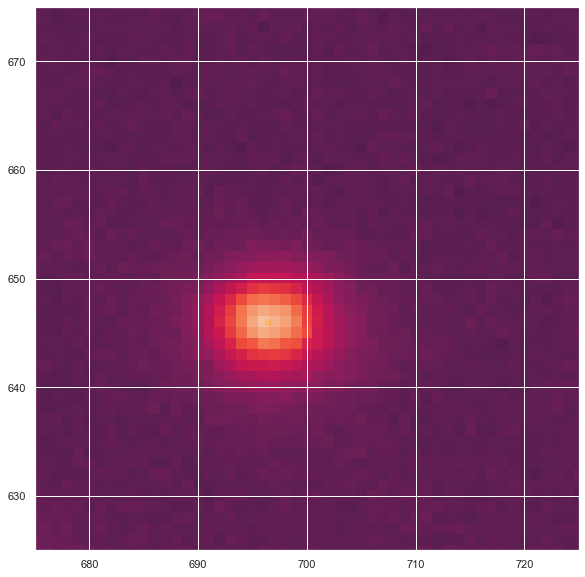

In [18]:
#zooming in on NNSer
imagen = (fits.open('NNser.fits'))[0].data
bkg_sigma = mad_std(imagen)
daofind = DAOStarFinder(fwhm=6., threshold=5.*bkg_sigma)
sources = daofind(imagen)
sources

plt.imshow(imagen, vmin=2500, vmax=4000)
plt.scatter(sources['xcentroid'], sources['ycentroid'], alpha=0.3, color="orange")
plt.xlim(675,725)
plt.ylim(625,675)
plt.show()

In [19]:
#using the abs mag formula to calc magnitude of ech source
magnitudes = -2.5*np.log10(final_sum)
print(magnitudes)

   aperture_sum_0  
-------------------
-12.350113965611492
-12.434844017384336
-14.723464053809014
-11.342922537900213
-11.266720851566847
-12.771647484643353
 -13.10859832878826
-10.445183926183754
-11.897405009631708
-14.593651460168772
                ...
-11.351365200176422
-12.175489872915824
-13.968626733624447
-14.127292664151135
 -10.92159650926898
-11.593319329572154
-10.441229067996453
-11.992989533329057
-13.186172542756239
-12.316193090794641
-12.322512961046495
Length = 63 rows
-8.765922550365897


In [62]:
# --- Obtaining Universal Time from Orginal Fit files --- 
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')

t = []

for file in  glob('O120308*'):
    image = fits.open(file)
    time = (image[0].header['UT'])
    t.append(time)


t_sp = []

for i in range(0, len(t)):
    t_s = t[i].split(':')
    t_sp = np.append(t_sp, t_s)

# print(len(t))
# print(len(t_sp))

hour = []
mins = []
seconds = []

for i in range(0, len(t)):
    hour_v = t_sp[0 + i*3]
    hour = np.append(hour, hour_v)

    mins_v = t_sp[1 + i*3]
    mins = np.append(mins, mins_v)

    seconds_v = t_sp[2 + i*3]
    seconds = np.append(seconds, seconds_v)

# print(int(hour[1])*3600 + int(mins[1])*60 + float(seconds[1]))
# print(mins)
# print(seconds)

total_seconds = []

# --- converting universal time to seconds --- 
for i in range(0, len(t)):
    total_seconds_v = int(hour[i])*3600 + int(mins[i])*60 + float(seconds[i])
    total_seconds = np.append(total_seconds, total_seconds_v)
    
print(total_seconds)
total_minutes = total_seconds/60
print(total_minutes)

timeminutes = np.around(total_minutes - total_minutes[0],2)
print(timeminutes)

[10425.905 10510.873 10596.574 10682.653 10852.123 10968.093 11083.753
 11199.454 11315.049 11430.831 11546.645 11662.685 11778.615 11894.335
 12010.024 12125.837 12242.236 12357.417]
[173.76508333 175.18121667 176.60956667 178.04421667 180.86871667
 182.80155    184.72921667 186.65756667 188.58415    190.51385
 192.44408333 194.37808333 196.31025    198.23891667 200.16706667
 202.09728333 204.03726667 205.95695   ]
[ 0.    1.42  2.84  4.28  7.1   9.04 10.96 12.89 14.82 16.75 18.68 20.61
 22.55 24.47 26.4  28.33 30.27 32.19]


In [22]:
#function for the signal to noise ratio
def SN(starflux,skyflux,pixelstar,pixelsky):
    return starflux/(np.sqrt(starflux+(pixelstar)*(1+pixelstar/pixelsky)*(skyflux + 3.37**2)))

In [83]:
#preforing photometry 
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')

data = []
time = []
unc = []
uncf = []
z = []
zer = []
totalerror=[]
faint = []
red_data = glob('red_*')
red_data = np.sort(red_data)

for image in red_data:
    openim = fits.open(image)
    t = openim[0].header['TIME']
    time.append(t)
    image = fits.getdata(image)
    
    
   
    bkg_sigma = mad_std(image)
    daofind = DAOStarFinder(fwhm=6., threshold= 5*bkg_sigma)
    sources = daofind(image)
    # Get the positions of sources in the field from the table above.
    positions = np.transpose((mastersources['xcentroid'], mastersources['ycentroid']))
    
    # Set up aperture and annulus
    aperture = CircularAperture(positions, r=5.)
    
    annulus_aperture = CircularAnnulus(positions, r_in=10., r_out=15.)
    
    # Make a list of apertures
    apers = [aperture, annulus_aperture]

    # And run aperture photometry
    phot_table = aperture_photometry(image, apers)


    # We calculate the mean counts in each pixel in the background annulus, and then multiply by the area
    # in the aperture to get the total background counts within each aperture

    bkg_mean = (phot_table['aperture_sum_1'])/(annulus_aperture.area)
    bkg_sum = bkg_mean * aperture.area
    
    
    # Now we get the final table of background subtracted counts within each aperture
    final_sum = phot_table['aperture_sum_0'] - bkg_sum
    
    
    magnitudes = -2.5*np.log10(final_sum)
        
        
        
    A =  -magnitudes[50] + 15.8
    B =  -magnitudes[64] +15.1
    C =  -magnitudes[63] + 13.7
    D =  -magnitudes[32] +13.7
        
        
    zero = np.array([A,B,C,D])
        
        
    zerom = np.mean(zero)
    z.append(zerom)
    er = np.sqrt(np.std(zero)/len(zero))
    zer.append(er)    
    NNSer = magnitudes[49] + zerom
     
        
    data.append(NNSer)
    
    
    
    
    f =  -2.5*np.log10(np.min(final_sum)) + zerom 
    faint.append(f) 
    ff = np.min(final_sum[49])/np.sqrt((np.min(final_sum[49]) +(np.min(phot_table['aperture_sum_1'][49]))*(1+(np.min(phot_table['aperture_sum_1'][49]))/(annulus_aperture.area))*(aperture.area + 3.37**2)))
    
    sf = final_sum[49]
    ns = phot_table['aperture_sum_1'][49]
    nsky = annulus_aperture.area
    skyf= aperture.area 
    
    
    SN = (final_sum[49])/np.sqrt((final_sum[49] +(phot_table['aperture_sum_1'][49])*(1+(phot_table['aperture_sum_1'][49])/(annulus_aperture.area))*(aperture.area + 3.37**2)))
    x = 2.5*np.log10(1+1/SN)
    
    unc.append(x)
    uncf.append(ff)
    toter = np.sqrt(x**2+er**2)
    totalerror.append(toter)


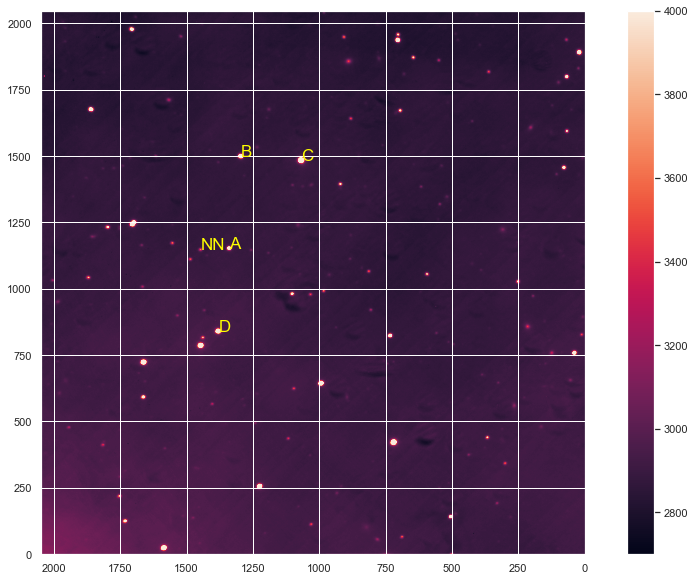

In [24]:

plt.imshow(imagec, vmin=2700, vmax=4000)

plt.colorbar()

plt.annotate('NN', (mastersources['xcentroid'][49], mastersources['ycentroid'][49]), color = 'yellow',fontsize=17)
plt.annotate('A', (mastersources['xcentroid'][50], mastersources['ycentroid'][50]), color = 'yellow',fontsize=17)
plt.annotate('B', (mastersources['xcentroid'][64], mastersources['ycentroid'][64]), color = 'yellow',fontsize=17)
plt.annotate('C', (mastersources['xcentroid'][63], mastersources['ycentroid'][63]), color = 'yellow',fontsize=17)
plt.annotate('D', (mastersources['xcentroid'][32], mastersources['ycentroid'][32]), color = 'yellow',fontsize=17)

plt.gca().invert_xaxis()
plt.gca().invert_yaxis()

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('masterimagestarlabelNNser.png')
plt.show() 

plt.show()


In [84]:
#writing data to a csv file
os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/data_2019/data_2019/NNSer/object/clear')
import pandas as pd

std = data 
uti = time 

lit = [std, uti]


test = np.array([std, uncf])


a = test


b = a 



mag = []
yeet = []
tt = []

print(np.shape(b))

for i in range(0, 18): 
    mag.append(b[0][i])
    yeet.append(b[1][i])
    tt.append(1 + i)
#     mag = np.round(mag, 2)

print(tt)



Output = [mag, yeet]

dataset = pd.DataFrame({'Magnitude': Output[0], 'Universal Time': Output[1], 'Order Ref.':tt})
print(dataset)



dataset.to_csv('uncer.csv')

dataset = pd.DataFrame({'Abs. Time': total_seconds})
dataset.to_csv('totalsec.csv')



(2, 18)
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
    Magnitude  Universal Time  Order Ref.
0   17.310031        0.099357           1
1   21.660051        0.001940           2
2   18.596526        0.031928           3
3   17.311848        0.102920           4
4   17.314113        0.103327           5
5   17.313095        0.094357           6
6   17.303747        0.110148           7
7   17.315271        0.120483           8
8   17.305412        0.121565           9
9   17.302359        0.117328          10
10  17.323392        0.100036          11
11  17.310629        0.095912          12
12  17.339164        0.084200          13
13  17.318535        0.104469          14
14  17.564782        0.083732          15
15  21.730521        0.001758          16
16  21.223433        0.002654          17
17  21.914218        0.001319          18
    Magnitude  Universal Time  Order Ref.
0   17.310031        0.099357           1
1   21.660051        0.001940           2
2   

In [86]:
test2 = np.array([mag, timeminutes])

c = test2


d = c 
print(d)


mag2 = []
yeet2 = []
tt2 = []

print(np.shape(d))

for i in range(0, 18): 
    mag2.append(d[0][i])
    yeet2.append(d[1][i])
    tt2.append(1 + i)
#     mag = np.round(mag, 2)

print(tt2)


# Output2 = [prob_uncer, col_uncer, freepath_uncer, Corrected_Voltage_Uncer]
Output2 = [mag2, yeet2]

dataset2 = pd.DataFrame({'Magnitude': Output2[0], 'Universal Time': Output2[1], 'Order Ref.':tt2})
print(dataset2)
# dataset.sort(['Magnitude', 'Universal Time'], ascending=[0, 1])



dataset2.to_csv('uncer2.csv')

dataset2 = pd.DataFrame({'Abs. Time': timeminutes})
dataset2.to_csv('totalsec2.csv')


[[17.31003098 21.66005138 18.59652625 17.31184834 17.31411312 17.31309505
  17.30374665 17.31527103 17.30541241 17.30235915 17.32339189 17.31062909
  17.33916358 17.31853473 17.56478197 21.73052078 21.22343339 21.91421844]
 [ 0.          1.42        2.84        4.28        7.1         9.04
  10.96       12.89       14.82       16.75       18.68       20.61
  22.55       24.47       26.4        28.33       30.27       32.19      ]]
(2, 18)
[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18]
    Magnitude  Universal Time  Order Ref.
0   17.310031            0.00           1
1   21.660051            1.42           2
2   18.596526            2.84           3
3   17.311848            4.28           4
4   17.314113            7.10           5
5   17.313095            9.04           6
6   17.303747           10.96           7
7   17.315271           12.89           8
8   17.305412           14.82           9
9   17.302359           16.75          10
10  17.323392           18.68  

In [87]:
data = pd.read_csv("allvalues.csv")
data.head() 

mag = data['MAG']
time = data['TOT']
faint = data['FAINT']
unc = data['UNC']
unf = data['UNCF']

18


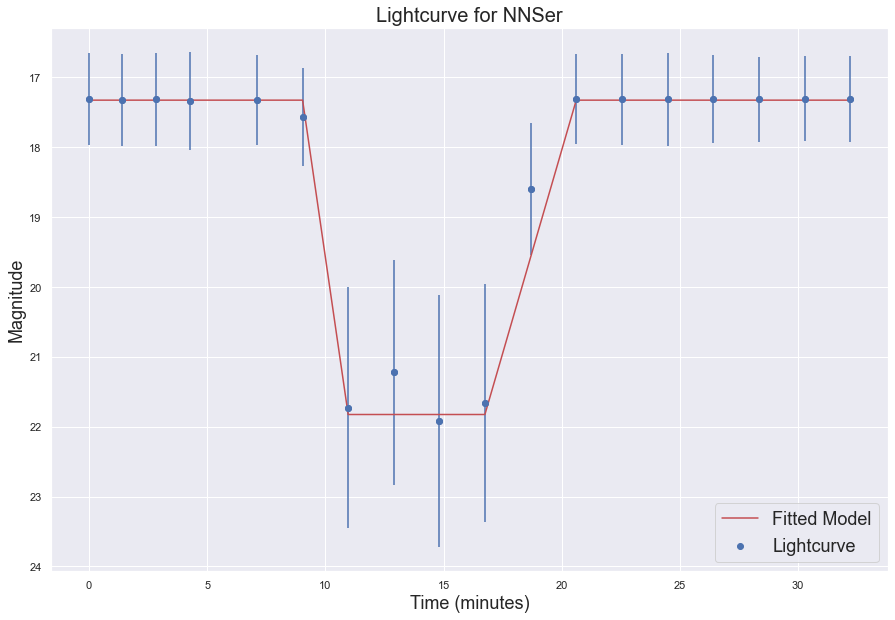

In [92]:

#plotting the light curve
plt.scatter(time, mag, label = 'Lightcurve')
plt.errorbar(time,mag,unc/4,fmt='o')
# plt.plot(time,data)
plt.title('Lightcurve for NNSer',fontsize = 20)
plt.xlabel('Time (minutes)',fontsize = 18)
plt.ylabel('Magnitude',fontsize = 18)
# plt.ylim(-7,-13)

timen = [0,1.416133333,2.844483333,4.279133333,7.103633333,9.036466667,10.96413333,12.89248333,14.81906667,16.74876667,20.613,
         22.54516667,24.47383333, 26.40198333,28.3322,30.27218333,32.19]

line_orig = models.Box1D(4.5,13,7.6)


# initialize model
line_init = models.Box1D()


# plot the model
plt.plot(timen, line_orig(timen)+17.325, 'r-', label='Fitted Model')

plt.gca().invert_yaxis()
plt.legend(loc='lower right', fontsize = 18)

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('lightcurve.png')
plt.show()



18


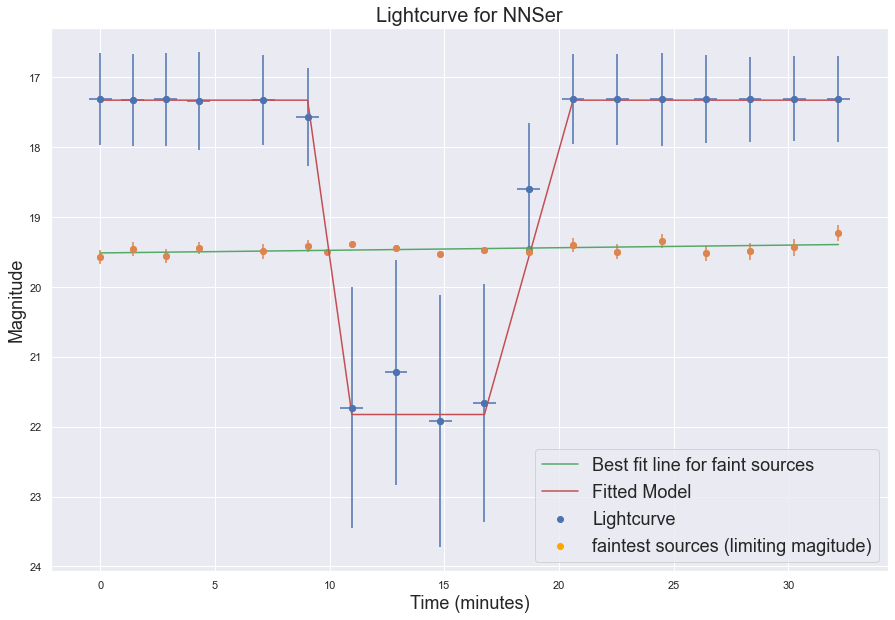

In [127]:
print(np.size(timeo))
#now to find the line and the point at which the eclipse can be seen
plt.scatter(timeo, mag, label = 'Lightcurve')
plt.errorbar(timeo,mag,unc/4,np.full(shape=len(timeo),fill_value = 0.5,dtype=float),fmt='o')
plt.scatter(timeo,faint,color = 'orange', label = 'faintest sources (limiting magitude)')
plt.errorbar(timeo,faint,unf,np.full(shape=len(timeo),fill_value = 0.05,dtype=float),fmt='o')
# plt.plot(time,data)
plt.title('Lightcurve for NNSer',fontsize = 20)
plt.xlabel('Time (minutes)',fontsize = 18)
plt.ylabel('Magnitude',fontsize = 18)
# plt.ylim(-7,-13)


# initialize a linear fitter
fit = fitting.LinearLSQFitter()

# initialize a linear model
line_init = models.Linear1D()

# fit the data with the fitter
fitted_line = fit(line_init, time, faint)

# plot the model
plt.plot(time, fitted_line(time), 'g-', label='Best fit line for faint sources')

line_orig = models.Box1D(4.5,13,7.8)


# initialize model
line_init = models.Box1D()


# plot the model
plt.plot(timen, line_orig(timen)+17.325, 'r-', label='Fitted Model')
plt.scatter(9.9,19.5)
plt.scatter(18.7,19.45)
plt.gca().invert_yaxis()
plt.legend(loc='lower right', fontsize = 18)

os.chdir(r'C:/Users/laura/OneDrive/Documents/3rd year/Astro lab/AstroCCDimage/images')
plt.savefig('lightcurveanalysis.png')
plt.show()

#below the green line one star is not visable - eclips

In [112]:
print(time[5],time[11])

9.036466667000001 20.613000000000003
